# Classify architecture type from an image of a home

## Setup

In [1]:
# Need to run `PYTORCH_ENABLE_MPS_FALLBACK=1 jupyter notebook` before loading this notebook
# there is an error that pops up later with augmentation that I couldn't figure out how to change while in the notebook.

# Suppress warnings from PyTorch
import warnings
warnings.filterwarnings("ignore", category=UserWarning, module="torch.nn.functional")

# fastai V1 library which sits on top of Pytorch 1.0
from fastai.vision import *

import requests

from bs4 import BeautifulSoup

from fastai.vision.all import *
from fastai.vision import *

# import my custom functions
from src.utils import _label_func

import pandas as pd
import matplotlib.pyplot as plt

import os
import sys

# add the 'src' directory as one where we can import modules
src_dir = os.path.join(os.getcwd(), 'src') #os.pardir, 'src')
sys.path.append(src_dir)

%load_ext autoreload
%autoreload 2

# Loading custom functions
from plot_map import find_unique, plot_arch_map, simpson_index, get_blocks, assign_block

import seaborn as sns

# Get color classes for plotting later
prediction_colors = {'bungalow': '#003f5c', 'victorian': '#7a5195', 'prairie': '#ef5675', 'foursquare': '#ffa600'}


## Look at results

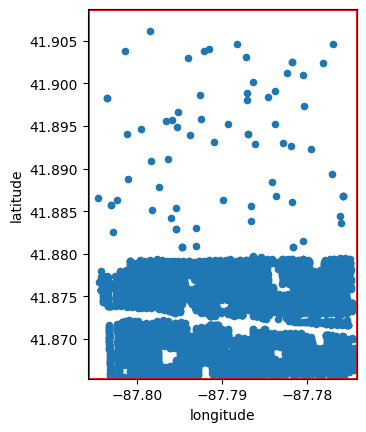

In [247]:
# now I need to find out how to extract data...
# soup.contents

# ok- thinking about this
# according to xx there are 25000 homes in Oak Park
# on redfin, there are ~3000 in last 5 years

# TODO make sure my scraping script is outputting home metadata correctly

# load redfin metadata
rf_metadata = pd.read_csv('data/interim/rf_meta.csv')

# Fill NaN values with a placeholder integer (e.g., -1)
rf_metadata['property_id'] = rf_metadata['property_id'].fillna(-1).astype(int)

# Google maps coordinates of bounding box for Oak Park
uleft = 41.90872286303018, -87.80575098756486
lright = 41.86533629647352, -87.7741652965275

# Filter out homes that are not in Oak Park (based on google maps coordinates)
rf_metadata['in_oak_park'] = [1 if x['latitude'] < uleft[0] and x['latitude'] > lright[0] and x['longitude'] < lright[1] and x['longitude'] > uleft[1] else 0 for x in rf_metadata.to_dict(orient='records')]
rf_metadata = rf_metadata[rf_metadata['in_oak_park'] == 1]

# Plot the latitude and longitude of the homes
rf_metadata.plot(kind='scatter', x='longitude', y='latitude')

# Draw rectangle for Oak Park
plt.gca().add_patch(plt.Rectangle((uleft[1], lright[0]), lright[1] - uleft[1], uleft[0] - lright[0], 
                                  edgecolor='r', facecolor='none', lw=2))

plt.xlim(min(rf_metadata['longitude'].min(), uleft[1]), max(rf_metadata['longitude'].max(), lright[1]))
plt.ylim(min(rf_metadata['latitude'].min(), lright[0]), max(rf_metadata['latitude'].max(), uleft[0]))

plt.gca().set_aspect('equal', adjustable='box')

## House image classifier

### Image loading setup

In [146]:
# get images for training the model
path = "/Users/chad/github/architecture/images/training"
fnames = get_image_files(path)

len(fnames) # 109 images


109

### Use image augmentation to increase training samples

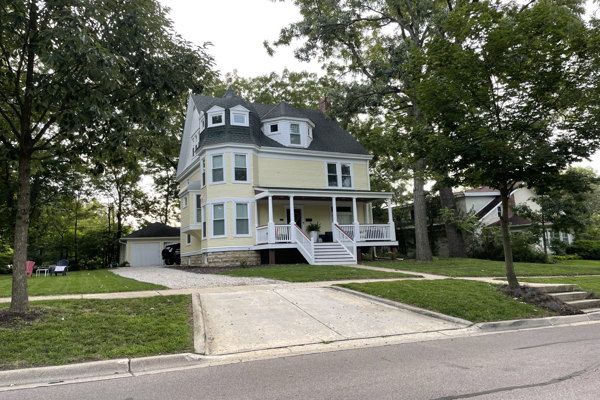

In [147]:
# single image of a house
img = PILImage(PILImage.create(fnames[0]).resize((600,400)))
img

In [148]:
# Setup augmentation transforms of image
# NB: I took these parameters from an existing project on github-
# https://github.com/dumitrux/architectural-style-recognition/blob/master/src/architectural-style-recognition.ipynb
# The get_transforms function is for the old fastai/pytorch versions so now we need to use aug_transforms

tfms = aug_transforms(pad_mode='zeros', mult=2, min_scale=0.75, do_flip=True, flip_vert=False, max_rotate=3, max_zoom=1.1,
                     max_lighting=0.2, max_warp=0.1, p_affine=0.75, p_lighting=0.5)


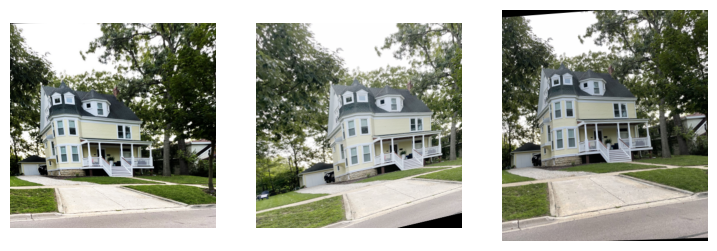

In [149]:
# Visualize the image transformations

from fastai.vision.all import TensorImage

timg = TensorImage(array(img)).permute(2,0,1).float()/255.

def _batch_ex(bs):
    return TensorImage(timg[None].expand(bs, *timg.shape).clone())

# plot some sample transformations
y = _batch_ex(9)
for t in tfms: y = t(y, split_idx=0)
_,axs = plt.subplots(1,3, figsize=(9,3))
for i,ax in enumerate(axs.flatten()): show_image(y[i], ctx=ax)

# save this image to a file
plt.axis('tight')
plt.savefig('reports/figures/warp.jpg')


In [150]:
# this way was using cap letter as labeler
# dls = ImageDataLoaders.from_name_func(path, files, label_func, bs=5, item_tfms=Resize(224), valid_pct=0.2)
# valid_pct is the percent of images used for validation

# this pulls the label from the file name (stuff before _ or -)
# dls = ImageDataLoaders.from_name_re(path, files, pat='^(.*)[_-].*?.jpg', item_tfms=Resize(224), bs=5)

# trying datablock instead
# here the subfolder name is used as the label
dblock = DataBlock(blocks = (ImageBlock, CategoryBlock),
                   get_items = get_image_files,
                   get_y = parent_label,
                   splitter = RandomSplitter(valid_pct=0.2, seed=44),
                   item_tfms = Resize(224),
                   batch_tfms = tfms)

# does this help anything?
# batch_tfms = aug_transforms(size=224)
# load the data (batch size 5 minimum)
dls = dblock.dataloaders(path, bs=12)

/Users/chad/github/architecture/env/lib/python3.10/site-packages/torch/_tensor.py:1437: UserWarning: The operator 'aten::_linalg_solve_ex.result' is not currently supported on the MPS backend and will fall back to run on the CPU. This may have performance implications. (Triggered internally at /Users/runner/work/pytorch/pytorch/pytorch/aten/src/ATen/mps/MPSFallback.mm:13.)
  ret = func(*args, **kwargs)


NB: this spits out a pytorch warning, but it seems to work still

In [151]:
# show the data
'train:', len(dls.train.items), 'valid:', len(dls.valid.items)

('train:', 88, 'valid:', 21)

In [152]:
print("Training images:\n", [x.stem for x in dls.train.items], "\n")
print("Validation images:\n", [x.stem for x in dls.valid.items])

Training images:
 ['chicagobungalow4', 'The-Thomas-Wells-House', 'chicagobungalow3', '2449FourSquare', 'YellowFourSquare', '4703-Highland-Ave', 'The-Campbell-House', 'The-Joseph-Moore-House-e1694963944109', 'shutterstock_1263296944', 'forest-ave-4815', '21635476-1', 'main3', 'red-victorian-home-wrap-around-porch-964fcce8-6d2ab8ee6f5b4d79941bd8866d1fb9ec', '5217-Fairmount-Ave-From-Google', 'The-Mitchell-Heintz-House', 'The-Gerardus-J.-Verbeck-House', 'The-Hanson-House', 'The-A.C.-Riddler-House', 'The-Darnley-House', 'CH32FEAWIL_LuxeDryED_0110-fit=constrain&wid=2560&hei=1440', 'portland-foursquare-home', 'GettyImages-165432736-scaled', 'The-Ella-Beaudette-House-gray', 'abf48490bbdb4d68efe381f71b11336b', 'chicagobungalow5', 'Maple-Ave-1323-2', 'The-Reideler-House', '701-maple-ave-herring-house', '710-maple-ave-cole-house', 'framebungalow', 'chicagobungalow8', 'XL_11792_bigrock_winter07', 'what-is-a-bungalow', 'prairie_751ClintonPl', 'IMG_4992-scaled', 'victorian-home_window-world-hero_198

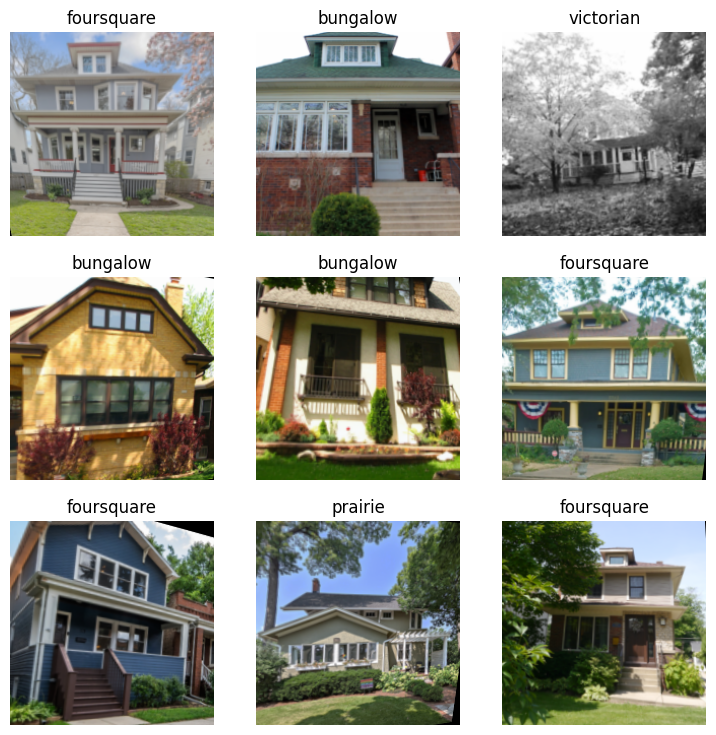

In [153]:
dls.show_batch()

In [154]:
# train the model
learn = vision_learner(dls, resnet34, metrics=error_rate)
# NB this was using ~6 cores on my local machine (macbook)

/Users/chad/github/architecture/env/lib/python3.10/site-packages/fastai/learner.py:53: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  state = torch.load(file, map_location=de

SuggestedLRs(valley=0.001737800776027143)

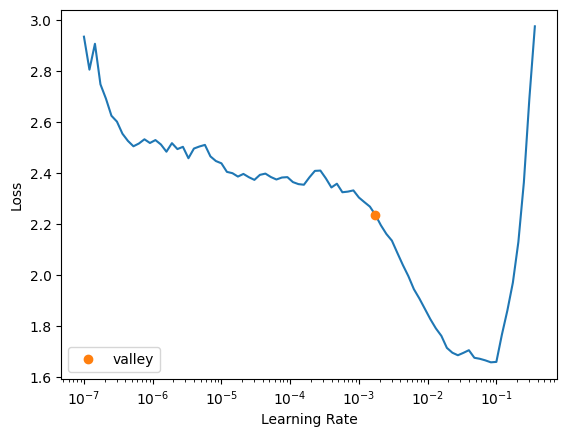

In [65]:
# ?? find optimal parameters for fine-tuning the model
# Find optimal learning rate
learn.lr_find()

In [156]:
# fine tune the learner
import random
import numpy as np

# Set random seed for reproducibility
random.seed(44)
np.random.seed(44)

learn.fine_tune(10, 0.0017)

epoch,train_loss,valid_loss,error_rate,time
0,0.251207,0.473913,0.238095,00:05


epoch,train_loss,valid_loss,error_rate,time
0,0.406695,0.579920,0.333333,00:05
1,0.258523,0.652490,0.333333,00:05
2,0.216080,0.684963,0.333333,00:05
3,0.187831,0.760714,0.285714,00:05
4,0.159361,0.609668,0.238095,00:05
5,0.147907,0.632540,0.238095,00:05
6,0.144125,0.710577,0.238095,00:05
7,0.123258,0.728042,0.238095,00:05
8,0.122408,0.601301,0.285714,00:05
9,0.111467,0.596688,0.142857,00:05


Getting pretty decent performance (>80% accuracy) with only this 110+ image set

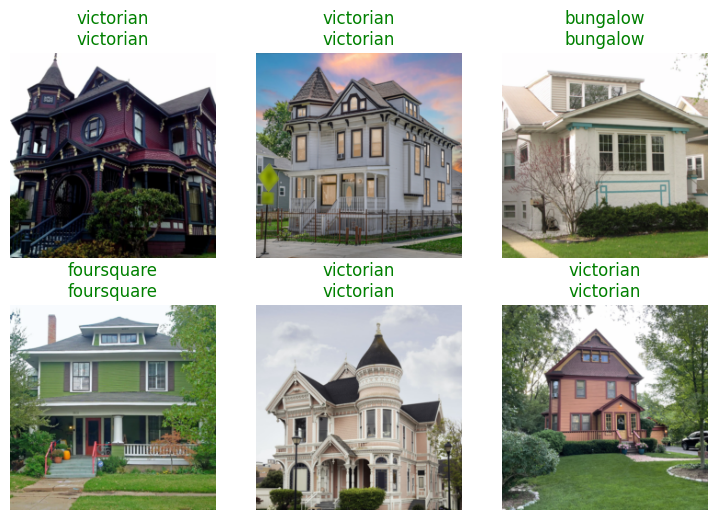

In [157]:
learn.show_results(max_n=6)
plt.savefig('reports/figures/learn_results.png')

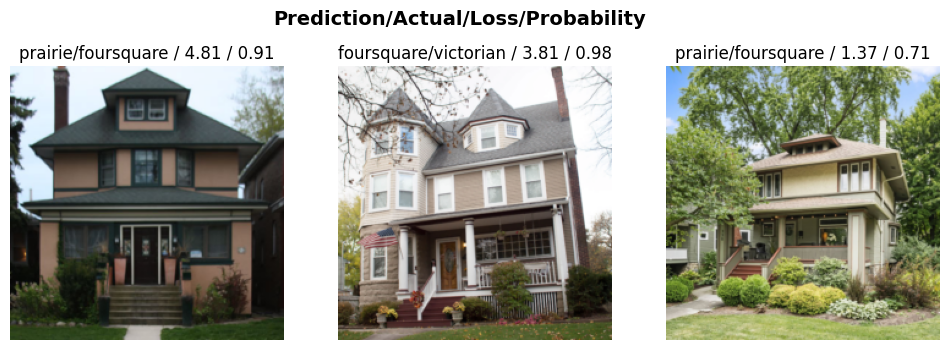

In [158]:
# find the images that give the most problems
interp = Interpretation.from_learner(learn)
interp.plot_top_losses(3, figsize=(12,4))

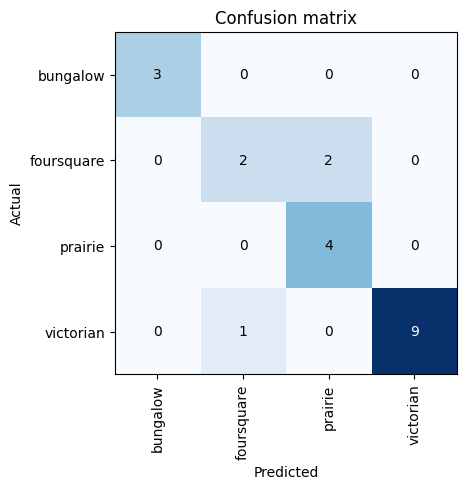

In [159]:
# look at confusion matrix
interp = ClassificationInterpretation.from_learner(learn)
interp.plot_confusion_matrix()
plt.savefig('reports/figures/confusion_matrix.png')

From this, we can see that bungalows, foursquares, and prairie-style homes all kind of blend together.

### Save and reload the final model

In [160]:
# learn.save('architecture_model')
# learn.load('architecture_model')

Path('models/architecture_model.pth')

## Predicting home types

### Using the trained model to predict house type from Redfin images

In [161]:
import os
import pandas as pd
from tqdm.notebook import tqdm

# Get list of file paths to the test images
test_images = get_image_files('images/testing')

df_preds = pd.DataFrame(columns=['image', 'prediction', 'probability'])

# Load and predict on each test image
for i in tqdm(range(len(test_images))):
    img_path = test_images[i]
    img = PILImage.create(img_path)
    pred, _, probs = learn.predict(img)
    # Get the basename of the first test image path
    nm = os.path.basename(img_path)
    # Selecting top prediction based on max probability (e.g., `.max().item()`)
    df = pd.DataFrame({'image': nm, 'prediction': pred, 'probability': probs.max().item()}, index=[0])
    df_preds = pd.concat([df_preds, df])

# Get the property ID from the image name
df_preds['pid'] = df_preds['image'].str.extract(r'pid(\d+)', expand=False)

# Convert property ID to integer
df_preds['pid'] = df_preds['pid'].astype(int)


  0%|          | 0/4297 [00:00<?, ?it/s]

array([[<Axes: title={'center': 'probability'}>]], dtype=object)

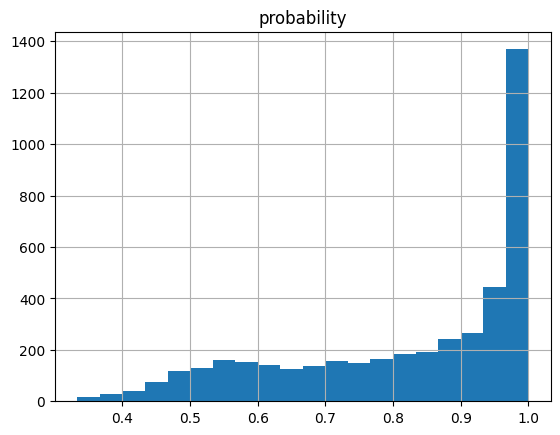

In [162]:
# Look at the distribution of probabilities across all predictions
df_preds.hist(column='probability', bins=20)


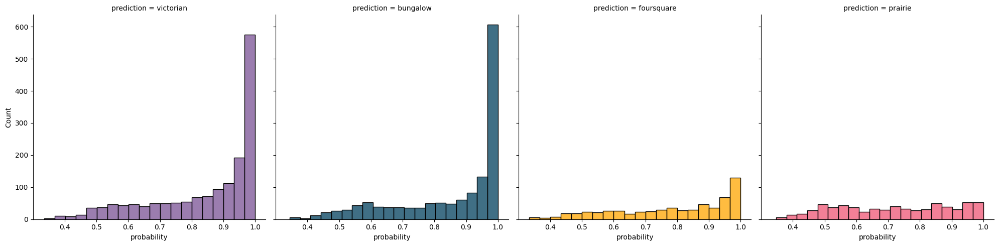

In [163]:
# Look at probabilities for home styles individually
g = sns.FacetGrid(data=df_preds, col='prediction', col_wrap=4, height=5, hue='prediction', palette=prediction_colors)
g.map(sns.histplot, 'probability', bins=20, kde=False)
plt.savefig('reports/figures/probability_hist.png')

In [164]:
df_preds.to_csv('data/interim/rf_predictions.csv', index=False)

## Data preprocessing

### Load interim rf metadata

<Axes: xlabel='longitude', ylabel='latitude'>

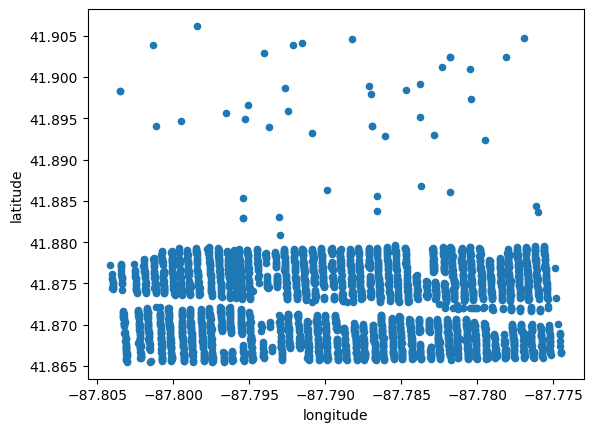

In [248]:
# TODO fix this - I want this all to be done in the scrape.py script

# Load interim dataset
rf_metadata = pd.read_csv('data/interim/rf_meta_year_updated.csv')

# Filter out homes that are not single-family
rf_metadata = rf_metadata[rf_metadata['home_type'] == 'Single-family']

# Google maps coordinates of bounding box for Oak Park
uleft = 41.90872286303018, -87.80575098756486
lright = 41.86533629647352, -87.7741652965275

# Filter out homes that are not in Oak Park (based on google maps coordinates)
rf_metadata['in_oak_park'] = [1 if x['latitude'] < uleft[0] and x['latitude'] > lright[0] and x['longitude'] < lright[1] and x['longitude'] > uleft[1] else 0 for x in rf_metadata.to_dict(orient='records')]
rf_metadata = rf_metadata[rf_metadata['in_oak_park'] == 1]

rf_metadata.plot(kind='scatter', x='longitude', y='latitude')


### Merge with predictions and save final dataset

NB: only run this if files have changed

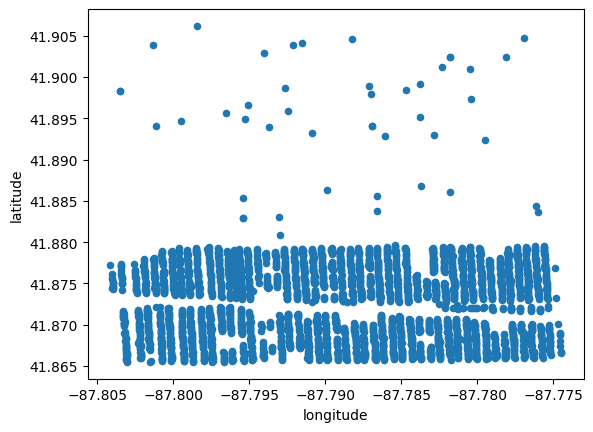

In [253]:
# Extract the relevant part of the image name using regex
# df_preds['extracted'] = df_preds['image'].str.extract(r'(\d+-\w+-\w+-\w+)', expand=False)
# df_preds['extracted'].values[0]

df_preds = pd.read_csv('data/interim/rf_predictions.csv')

df_merged = df_preds.merge(rf_metadata, left_on='pid', right_on='property_id')

df_merged.plot(kind='scatter', x='longitude', y='latitude')

df_merged.to_csv('data/processed/rf_predictions.csv', index=False)


### Load final dataset

In [254]:
df_merged = pd.read_csv('data/processed/rf_predictions.csv')


In [257]:
# Look at counts of predictions
df_merged['prediction'].value_counts()
# Most common is victorian- does that make sense?

prediction
victorian     1342
bungalow      1303
foursquare     510
prairie        479
Name: count, dtype: int64

## Visualizations

### Plot roads

<Axes: >

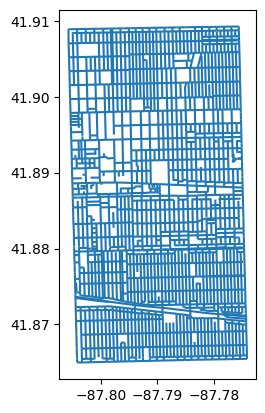

In [227]:
# Load roads database

import geopandas as gpd

# Import all roads NL
map_df = gpd.read_file('data/raw/roads/Street_Centerlines.shp')

# Convert from meters to lat/long
map_df = map_df.to_crs(epsg=4326)
map_df.plot()

### Mapping "alpha" diversity of architectural styles
In this section, we will create a heatmap plot to visualize the density of different architectural styles in Oak Park, IL. This type of plot helps in understanding the spatial distribution and density of various house types in the area. Note: I am using the concept of alpha diversity borrowed from the field of ecology. The idea is that in a given 30m radius, diversity is the number of unique home styles in that area.

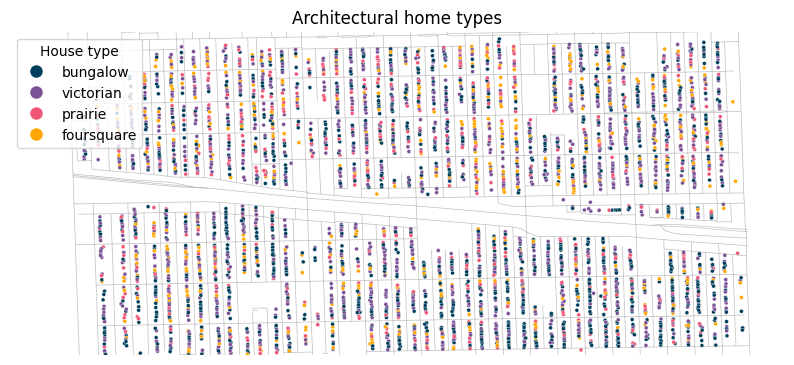

In [258]:
# Create unique home in radius column
df_merged['unique_homes_in_radius'] = find_unique(df_merged, radius=0.0002)  # .0001 is about 10 meters

# Plot only home types
plot_arch_map(df=df_merged, cols=prediction_colors, plot_title='Architectural home types',
              file_name='reports/figures/arch_div_p00_r20_noHM.png',
              heatmap=False, road_col='gray')


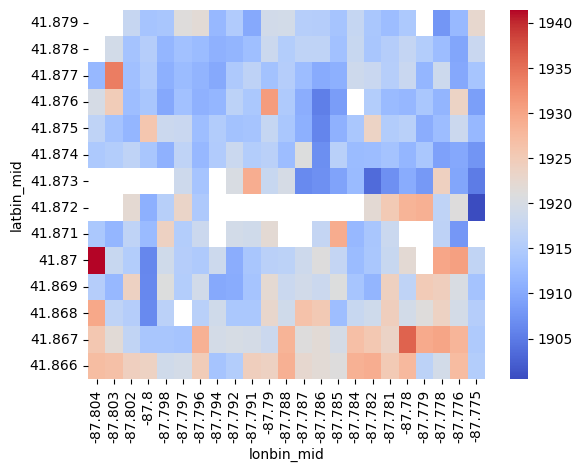

In [260]:

# This was something I was trying that creates a buffer around each home
# For smoothing over the exact location of each home
# gdf = gpd.GeoDataFrame(df_merged, geometry=gpd.points_from_xy(df_merged.longitude, df_merged.latitude))
# help(gdf.resample)
# gdf.buf = gdf.buffer(0.0005)

df = df_merged.copy()

# Filter out homes that are not in the target zip code
df = df[df['latitude'] < 41.88]

# Set the resolution of the heatmap
RESO = 25

fig, ax = plt.subplots(1, 1)

df['latbin'] = pd.cut(df['latitude'], bins=RESO)
df['lonbin'] = pd.cut(df['longitude'], bins=RESO)
df['latbin_mid'] = round(df['latbin'].apply(lambda x: x.mid).astype(float), 3)
df['lonbin_mid'] = round(df['lonbin'].apply(lambda x: x.mid).astype(float), 3)

df2 = df.groupby(['latbin_mid', 'lonbin_mid'])['year_built'].mean().unstack()
df2.sort_index(ascending=False, inplace=True)

sns.heatmap(df2, cmap='coolwarm', annot=False, ax=ax)
plt.savefig('reports/figures/heatmap.png')

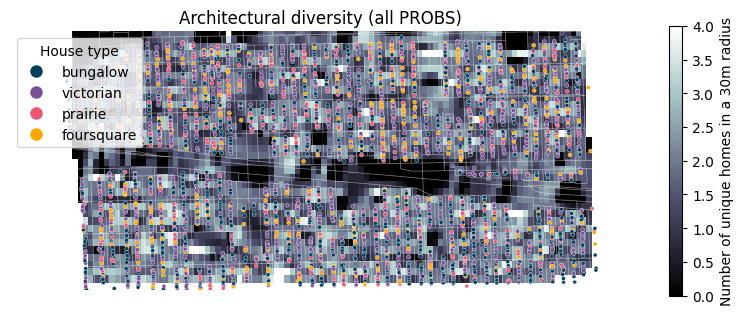

In [261]:
# Add in diversity layer
plot_arch_map(df=df_merged, cols=prediction_colors,
              plot_title='Architectural diversity (all PROBS)',
              file_name='reports/figures/arch_div_p00_r20.png',
              cmap='bone')

### Segment street blocks

/Users/chad/github/architecture/env/lib/python3.10/site-packages/momepy/utils.py:352: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gdf_network[length] = gdf_network.geometry.length


,geometry,size
0,"POLYGON ((-87.80240 41.89974, -87.80241 41.89988, -87.80242 41.90041, -87.80245 41.90129, -87.80246 41.90157, -87.80220 41.90157, -87.80137 41.90159, -87.80094 41.90159, -87.80092 41.90102, -87.80091 41.90046, -87.80090 41.90011, -87.80089 41.89977, -87.80128 41.89976, -87.80215 41.89975, -87.80240 41.89974))",0.000003
1,"POLYGON ((-87.80246 41.90157, -87.80245 41.90129, -87.80242 41.90041, -87.80241 41.89988, -87.80240 41.89974, -87.80282 41.89974, -87.80347 41.89973, -87.80392 41.89972, -87.80393 41.89999, -87.80396 41.90067, -87.80398 41.90142, -87.80398 41.90154, -87.80371 41.90155, -87.80295 41.90156, -87.80246 41.90157))",0.000003
2,"POLYGON ((-87.80392 41.89972, -87.80347 41.89973, -87.80282 41.89974, -87.80240 41.89974, -87.80239 41.89944, -87.80237 41.89859, -87.80236 41.89839, -87.80234 41.89792, -87.80258 41.89791, -87.80304 41.89791, -87.80337 41.89790, -87.80363 41.89789, -87.80386 41.89789, -87.80390 41.89904, -87.80392 41.89959, -87.80392 41.89972))",0.000003
3,"POLYGON ((-87.80240 41.89974, -87.80215 41.89975, -87.80128 41.89976, -87.80089 41.89977, -87.80088 41.89952, -87.80086 41.89890, -87.80084 41.89842, -87.80159 41.89840, -87.80236 41.89839, -87.80237 41.89859, -87.80239 41.89944, -87.80240 41.89974))",0.000002
4,"POLYGON ((-87.80246 41.90157, -87.80247 41.90179, -87.80249 41.90235, -87.80251 41.90299, -87.80253 41.90341, -87.80216 41.90341, -87.80176 41.90342, -87.80128 41.90343, -87.80100 41.90343, -87.80100 41.90327, -87.80097 41.90240, -87.80095 41.90179, -87.80094 41.90159, -87.80137 41.90159, -87.80220 41.90157, -87.80246 41.90157))",0.000003


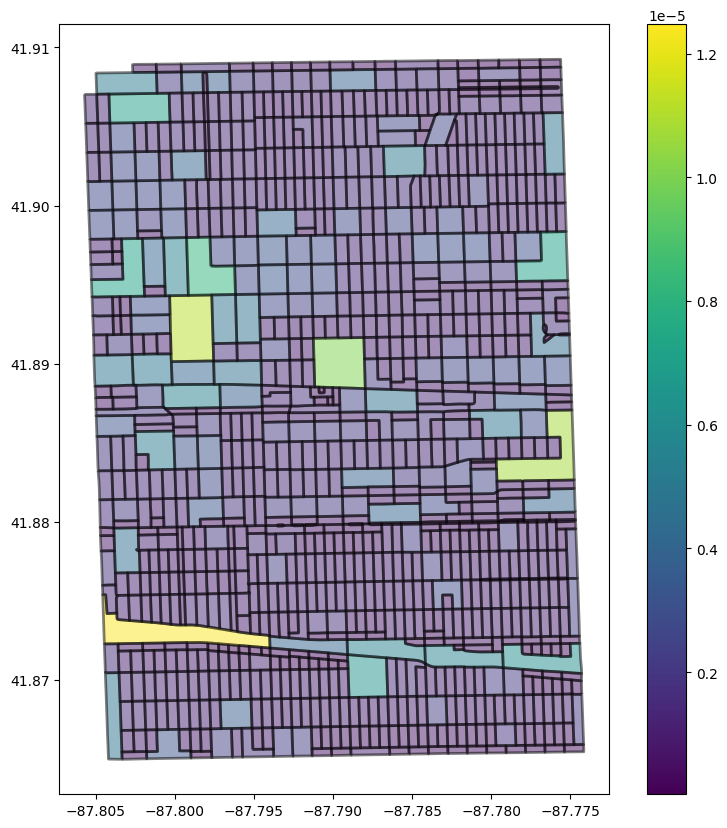

In [262]:
# Import roads shape files as a GeoDataFrame
blocks = get_blocks(shapefile = 'data/raw/roads/Street_Centerlines.shp', plot=True)
blocks.head()

In [263]:

# Assign each house to a block
df_merged['block'] = df_merged.apply(lambda x: assign_block((x['longitude'], x['latitude']), blocks), axis=1)
df_merged

,image,prediction,probability,pid,input,match,property_id,latitude,longitude,search_url,...,home_type,year_built,lot_size,price,beds,baths,sqft,in_oak_park,unique_homes_in_radius,block
0,1019-Highland-Ave_pid13251221.jpg,victorian,0.998585,13251221,1019 HIGHLAND AV,1019 Highland Ave,13251221,41.870135,-87.781963,/IL/Oak-Park/1019-Highland-Ave-60304/home/13251221,...,Single-family,1914.0,3780.0,NaN,4.0,2.5,1592.0,1,2,560
1,1040-S-Taylor-Ave_pid13251489.jpg,bungalow,0.987945,13251489,1040 S TAYLOR,1040 S Taylor Ave,13251489,41.869238,-87.777672,/IL/Oak-Park/1040-S-Taylor-Ave-60304/home/13251489,...,Single-family,1905.0,6300.0,NaN,4.0,2.0,1794.0,1,1,835
2,1167-S-Taylor-Ave_pid13251174.jpg,bungalow,0.999910,13251174,1167 S TAYLOR AVE,1167 S Taylor Ave,13251174,41.866586,-87.778146,/IL/Oak-Park/1167-S-Taylor-Ave-60304/home/13251174,...,Single-family,1894.0,6150.0,390000.0,4.0,1.0,NaN,1,2,31
3,610-Clarence-Ave_pid13248712.jpg,victorian,0.622182,13248712,610 CLARENCE AV,610 Clarence Ave,13248712,41.877530,-87.790208,/IL/Oak-Park/610-Clarence-Ave-60304/home/13248712,...,Single-family,1918.0,5670.0,NaN,4.0,1.0,1946.0,1,2,792
4,732-S-Taylor-Ave_pid13252072.jpg,bungalow,0.999126,13252072,732 S TAYLOR AVE,732 S Taylor Ave,13252072,41.875122,-87.777870,/IL/Oak-Park/732-S-Taylor-Ave-60304/home/13252072,...,Single-family,1918.0,4725.0,760000.0,4.0,4.0,2415.0,1,2,687
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3629,832-Highland-Ave_pid13250800.jpg,victorian,0.963408,13250800,832 HIGHLAND AV,832 Highland Ave,13250800,41.873276,-87.781535,/IL/Oak-Park/832-Highland-Ave-60304/home/13250800,...,Single-family,1909.0,4687.0,NaN,3.0,2.5,1456.0,1,3,442
3630,727-S-Cuyler-Ave_pid13252693.jpg,bungalow,0.885695,13252693,727 S CUYLER,727 S Cuyler Ave,13252693,41.875298,-87.783350,/IL/Oak-Park/727-S-Cuyler-Ave-60304/home/13252693,...,Single-family,1913.0,4725.0,NaN,3.0,2.0,2019.0,1,2,226
3631,224-Flournoy-St_pid13251419.jpg,prairie,0.936313,13251419,224 FLOURNOY,224 Flournoy St,13251419,41.871993,-87.780450,/IL/Oak-Park/224-Flournoy-St-60304/home/13251419,...,Single-family,1925.0,4410.0,NaN,3.0,2.0,864.0,1,2,890
3632,1159-S-Scoville-Ave_pid13245651.jpg,bungalow,0.970558,13245651,1159 S SCOVILLE,1159 S Scoville Ave,13245651,41.866664,-87.787984,/IL/Oak-Park/1159-S-Scoville-Ave-60304/home/13245651,...,Single-family,1962.0,3150.0,NaN,2.0,2.0,988.0,1,3,742


In [264]:
# Calculate the Simpson index for each block
df_merged['simpson'] = df_merged['prediction'].groupby(df_merged['block']).transform(simpson_index)

In [265]:
# Find a particular home
df_merged[df_merged['block'] == 203].head()

# Find a particular home address by fuzzy search
# df_merged[df_merged['match'].str.contains('613')]


,image,prediction,probability,pid,input,match,property_id,latitude,longitude,search_url,...,year_built,lot_size,price,beds,baths,sqft,in_oak_park,unique_homes_in_radius,block,simpson
46,601-S-Grove-Ave_pid13249170.jpg,prairie,0.641018,13249170,601 S GROVE AV,601 S Grove Ave,13249170,41.878190,-87.795656,/IL/Oak-Park/601-S-Grove-Ave-60304/home/13249170,...,1920.0,4950.0,NaN,4.0,2.0,2121.0,1,1,203,0.685121
791,634-Carpenter-Ave_pid13249334.jpg,prairie,0.827218,13249334,634 CARPENTER AVE,634 Carpenter Ave,13249334,41.877094,-87.796011,/IL/Oak-Park/634-Carpenter-Ave-60304/home/13249334,...,1914.0,6373.0,NaN,3.0,2.0,1793.0,1,1,203,0.685121
1065,629-S-Grove-Ave_pid13249204.jpg,bungalow,0.999391,13249204,629 S GROVE,629 S Grove Ave,13249204,41.877207,-87.795603,/IL/Oak-Park/629-S-Grove-Ave-60304/home/13249204,...,1912.0,5000.0,NaN,3.0,1.0,1140.0,1,2,203,0.685121
1081,621-S-Grove-Ave_pid13249535.jpg,victorian,0.423132,13249535,621 S GROVE AVE,621 S Grove Ave,13249535,41.877516,-87.795605,/IL/Oak-Park/621-S-Grove-Ave-60304/home/13249535,...,1909.0,5000.0,625000.0,3.0,2.0,NaN,1,1,203,0.685121
1154,606-Carpenter-Ave_pid13249335.jpg,victorian,0.835246,13249335,606 CARPENTER,606 Carpenter Ave,13249335,41.877987,-87.796002,/IL/Oak-Park/606-Carpenter-Ave-60304/home/13249335,...,1911.0,3600.0,NaN,4.0,1.0,1404.0,1,1,203,0.685121


<Axes: xlabel='simpson', ylabel='Count'>

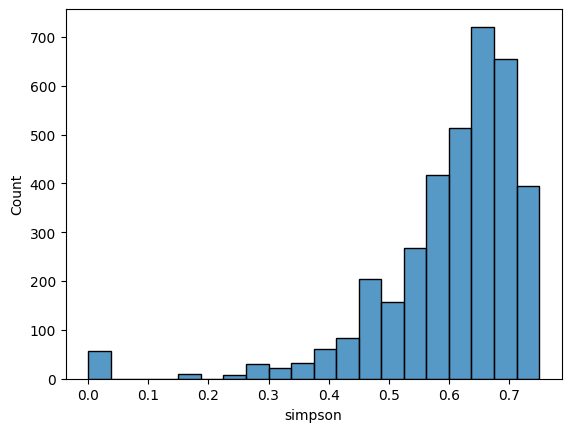

In [266]:
# Plot a histogram of the Simpson index
sns.histplot(df_merged['simpson'], bins=20)


<Axes: xlabel='longitude', ylabel='latitude'>

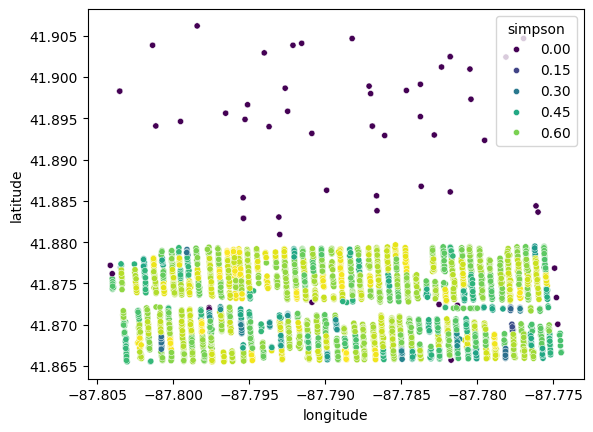

In [267]:
# Plot the blocks with colors corresponding to the Simpson index
sns.scatterplot(data=df_merged, x='longitude', y='latitude', hue='simpson', palette='viridis', s=20)


,simpson,home_value,year_built,latitude,longitude
simpson,1.000000,0.001131,-0.064637,-0.172010,-0.090408
home_value,0.001131,1.000000,0.018910,0.155593,-0.168018
year_built,-0.064637,0.018910,1.000000,-0.132466,0.018887
latitude,-0.172010,0.155593,-0.132466,1.000000,0.011332
longitude,-0.090408,-0.168018,0.018887,0.011332,1.000000


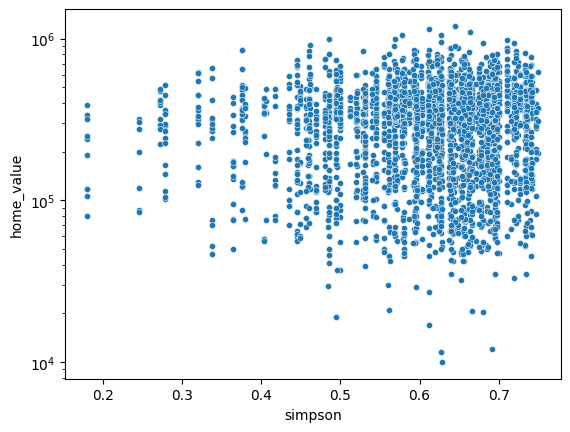

In [268]:
# Plot home values and Simpson index
g = sns.scatterplot(data=df_merged[(df_merged['simpson'] > 0) & (df_merged['home_value'] < 2e6)], x='simpson', y='home_value', s=20)
g.set_yscale('log')

# Is this relationship significant?

# Calculate the correlation between the Simpson index and home value
df_merged[['simpson', 'home_value', 'year_built', 'latitude', 'longitude']].corr()

# sns.scatterplot(data=df_merged[(df_merged['simpson'] > 0) & (df_merged['home_value'] < 2e6)], x='simpson', y='latitude', s=20)

# Prob not, but the correlation matrix shows that latitude and simpson index are strongly correlated (-0.25)


<Axes: xlabel='year_built', ylabel='simpson'>

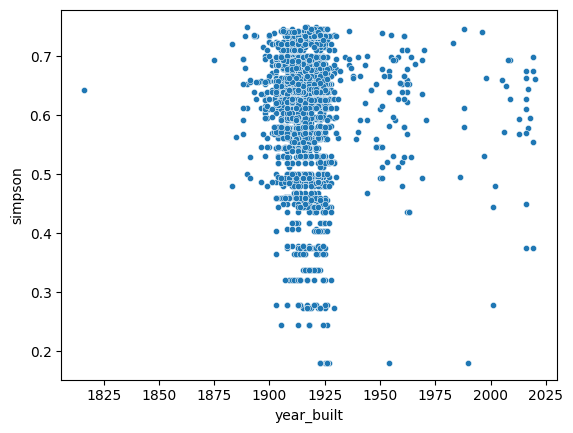

In [269]:
# Plot the Simpson index against the year built
sns.scatterplot(data=df_merged[(df_merged['simpson'] > 0) & (df_merged['home_value'] < 2e6)],
                x='year_built', y='simpson', s=20)

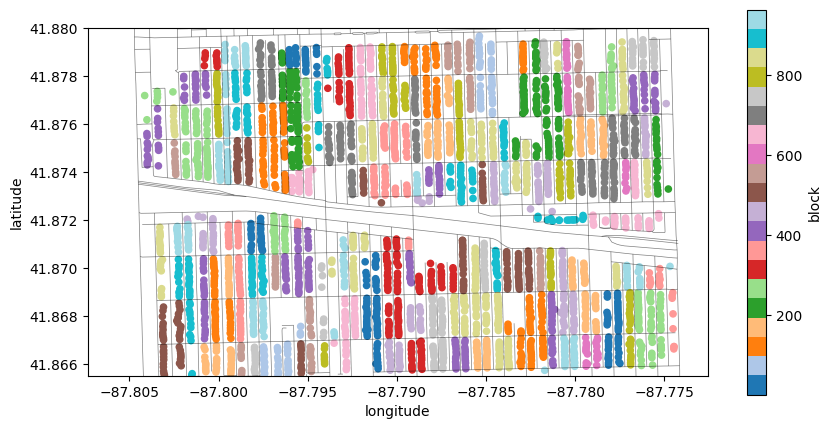

In [270]:
# Plot the blocks with colors corresponding to the block each house is in
fig, ax = plt.subplots(figsize=(10, 5))

df_merged.plot('longitude', 'latitude', kind='scatter', c='block', cmap='tab20', ax=ax)

# Overlay the roads
map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)

ax.set_ylim(df_merged['latitude'].min(), 41.88)

plt.savefig('reports/figures/blocks.png')

### Create map of Simpson index by block

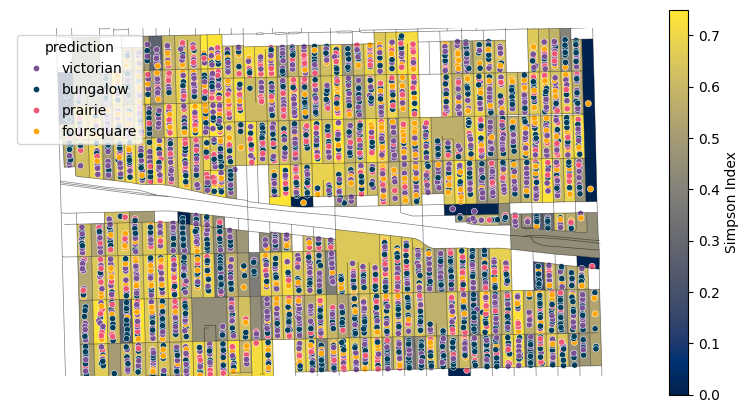

In [271]:
blocks.index.name = 'blockID'

simp_ind = df_merged.groupby('block')['simpson'].mean()

blocks2 = blocks
blocks2['simpson'] = simp_ind.loc[simp_ind.index.intersection(blocks2.index)]

fig, ax = plt.subplots(figsize=(10, 5))

blocks2.plot(column='simpson', ax=ax, cmap='cividis')

# Overlay the roads
map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)

ax.set_ylim(df_merged['latitude'].min(), 41.88)

sns.scatterplot(df_merged, x='longitude', y='latitude', hue='prediction', palette=prediction_colors, s=20, ax=ax)

# Add color scale bar
sm = plt.cm.ScalarMappable(cmap='cividis', norm=plt.Normalize(vmin=blocks2['simpson'].min(), vmax=blocks2['simpson'].max()))
sm._A = []
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Simpson Index')

ax.set_axis_off()

# Save the figure
plt.savefig('reports/figures/simpson_index.png')

### Trying some different probability cutoffs

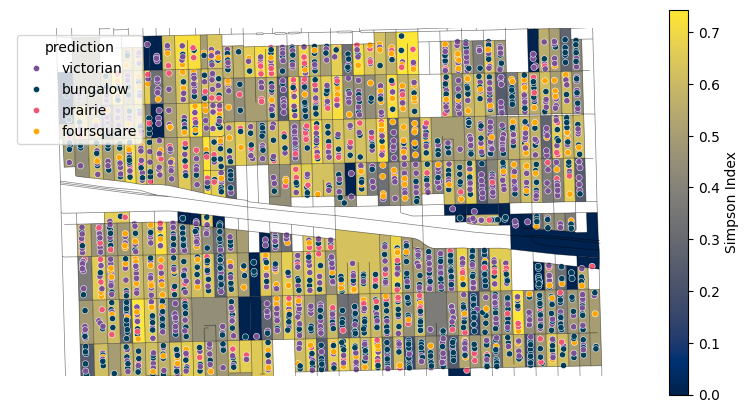

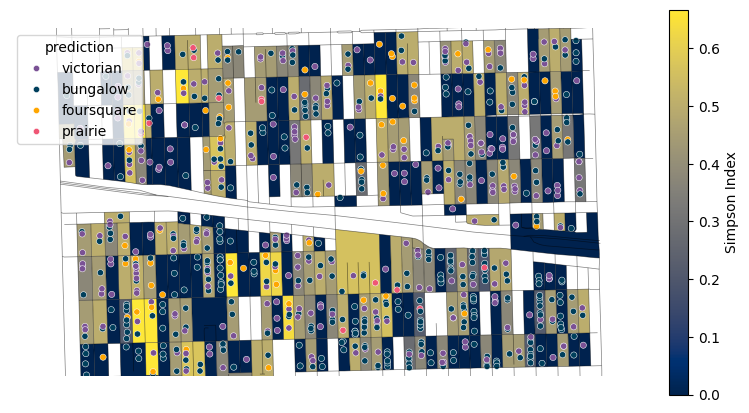

In [272]:
blocks.index.name = 'blockID'

PALETTE = 'cividis'

# Plot blocks with medium-high probability (>80%)
PROB_CUTOFF = 0.8
simp_ind = df_merged[df_merged['probability'] > PROB_CUTOFF].groupby('block')['prediction'].apply(simpson_index)
blocks2 = blocks
blocks2['simpson'] = simp_ind.loc[simp_ind.index.intersection(blocks2.index)]
fig, ax = plt.subplots(figsize=(10, 5))
blocks2.plot(column='simpson', ax=ax, cmap=PALETTE)
# Overlay the roads
map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)
ax.set_ylim(df_merged['latitude'].min(), 41.88)
sns.scatterplot(df_merged[df_merged['probability'] > PROB_CUTOFF], x='longitude', y='latitude', hue='prediction', palette=prediction_colors, s=20, ax=ax)
# Add color scale bar
sm = plt.cm.ScalarMappable(cmap=PALETTE, norm=plt.Normalize(vmin=blocks2['simpson'].min(), vmax=blocks2['simpson'].max()))
sm._A = []
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Simpson Index')
ax.set_axis_off()
# Save figure
plt.savefig('reports/figures/simpson_index_prob_' + str(int(100*PROB_CUTOFF)) + '.png')


# Plot blocks with very-high probability (>80%)
PROB_CUTOFF = 0.99
simp_ind = df_merged[df_merged['probability'] > PROB_CUTOFF].groupby('block')['prediction'].apply(simpson_index)
blocks2 = blocks
blocks2['simpson'] = simp_ind.loc[simp_ind.index.intersection(blocks2.index)]
fig, ax = plt.subplots(figsize=(10, 5))
blocks2.plot(column='simpson', ax=ax, cmap=PALETTE)
# Overlay the roads
map_df.plot(ax=ax, color='black', linewidth=0.5, alpha=0.5)
ax.set_ylim(df_merged['latitude'].min(), 41.88)
sns.scatterplot(df_merged[df_merged['probability'] > PROB_CUTOFF], x='longitude', y='latitude', hue='prediction', palette=prediction_colors, s=20, ax=ax)
# Add color scale bar
sm = plt.cm.ScalarMappable(cmap=PALETTE, norm=plt.Normalize(vmin=blocks2['simpson'].min(), vmax=blocks2['simpson'].max()))
sm._A = []
cbar = plt.colorbar(sm, ax=ax)
cbar.set_label('Simpson Index')
ax.set_axis_off()
# Save figure
plt.savefig('reports/figures/simpson_index_prob_' + str(int(100*PROB_CUTOFF)) + '.png')



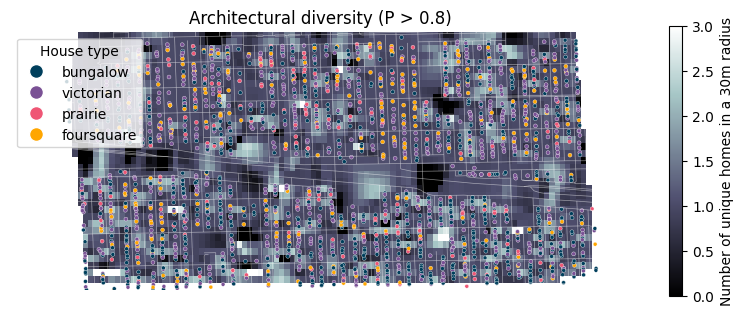

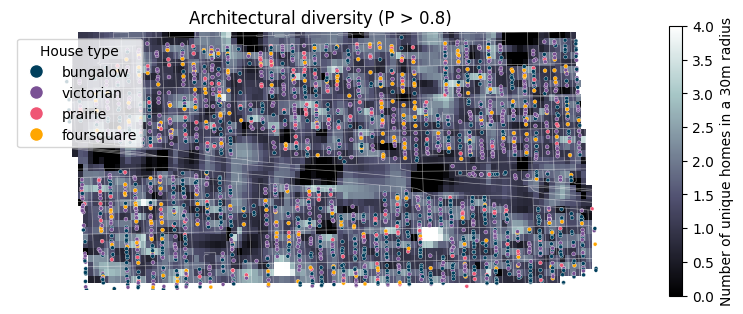

In [273]:
# Create a new column for number of unique homes in a given radius
df_merged['unique_homes_in_radius'] = float('nan')

# Subset the data frame to include only high confidence predictions
idx = df_merged['probability'] > 0.8
plot_df = df_merged[idx]

# Plot with 10m radius
plot_df.loc[idx, 'unique_homes_in_radius'] = find_unique(plot_df, radius=0.0001)  # .0001 is about 10 meters
plot_arch_map(df=plot_df, cols=prediction_colors, plot_title='Architectural diversity (P > 0.8)', file_name='reports/figures/arch_div_p80_r10.png')

# Plot with 20m radius
plot_df.loc[idx, 'unique_homes_in_radius'] = find_unique(plot_df, radius=0.0002)  # .0002 is about 20 meters
plot_arch_map(df=plot_df, cols=prediction_colors, plot_title='Architectural diversity (P > 0.8)', file_name='reports/figures/arch_div_p80_r20.png')


### More plots

<Axes: xlabel='prediction', ylabel='home_value'>

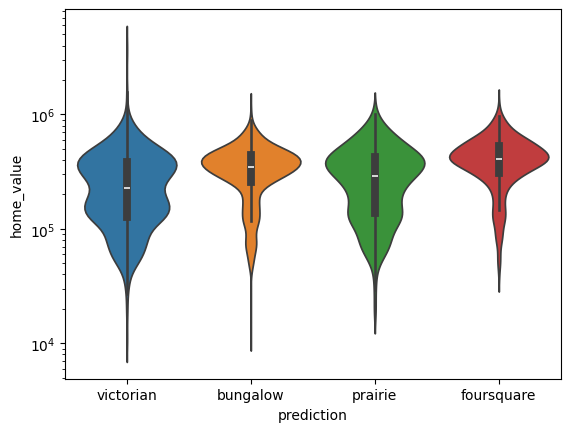

In [274]:
sns.violinplot(data=df_merged, x='prediction', y='home_value', hue='prediction', legend=False, log_scale=True)

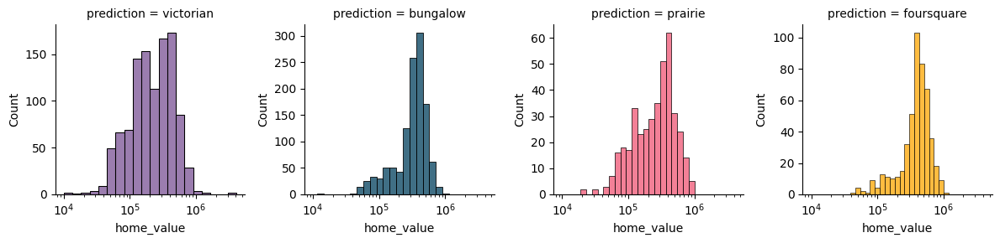

In [275]:
# Plot histograms of home values for each prediction
g = sns.FacetGrid(df_merged, col='prediction', col_wrap=4, sharey=False, hue='prediction', palette=prediction_colors)
g.map(sns.histplot, 'home_value', bins=20, log_scale=True)

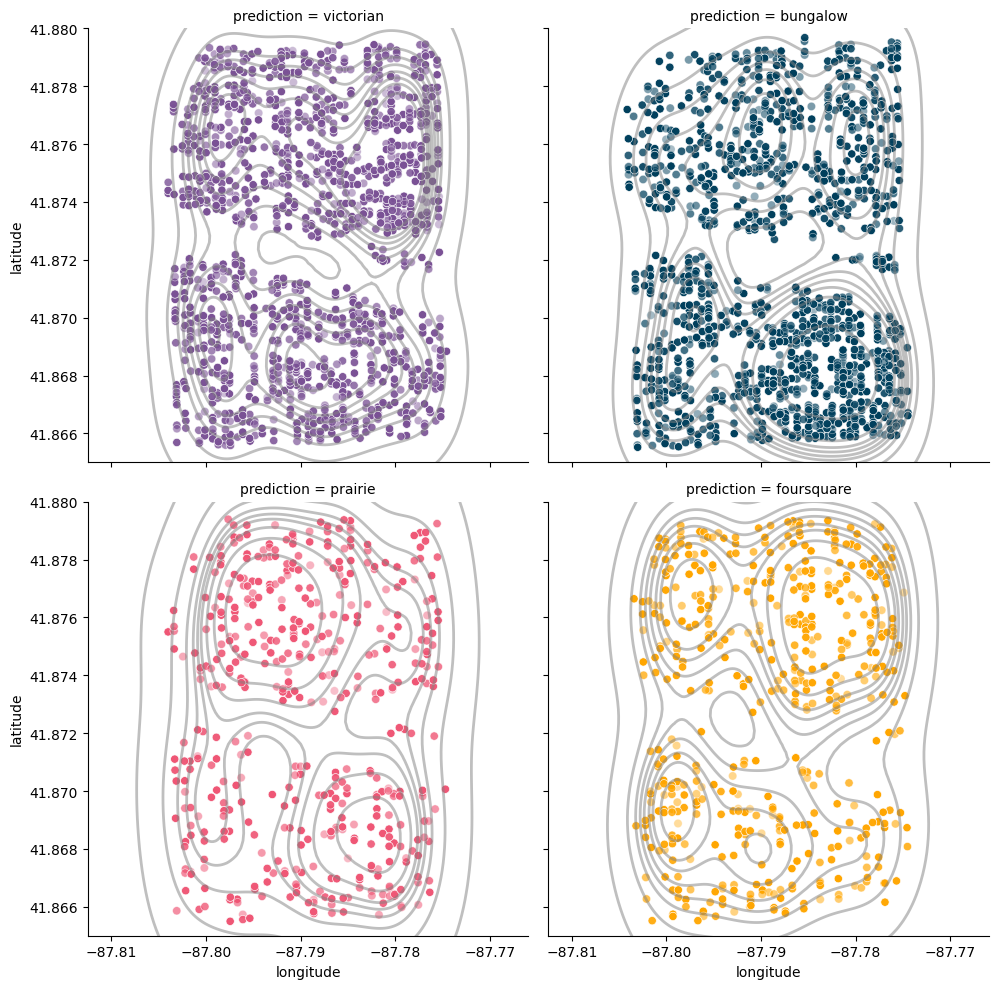

In [276]:
# Plot the distribution of different architectural home styles

g = sns.FacetGrid(df_merged, col='prediction', col_wrap=2, height=5, hue='prediction', palette=prediction_colors)

g.map(sns.scatterplot, 'longitude', 'latitude', alpha=df_merged['probability'])
g.map(sns.kdeplot, 'longitude', 'latitude', levels=10, color='gray', linewidths=2, alpha=0.5)

g.set(ylim=(41.865, 41.88))


## Regressions

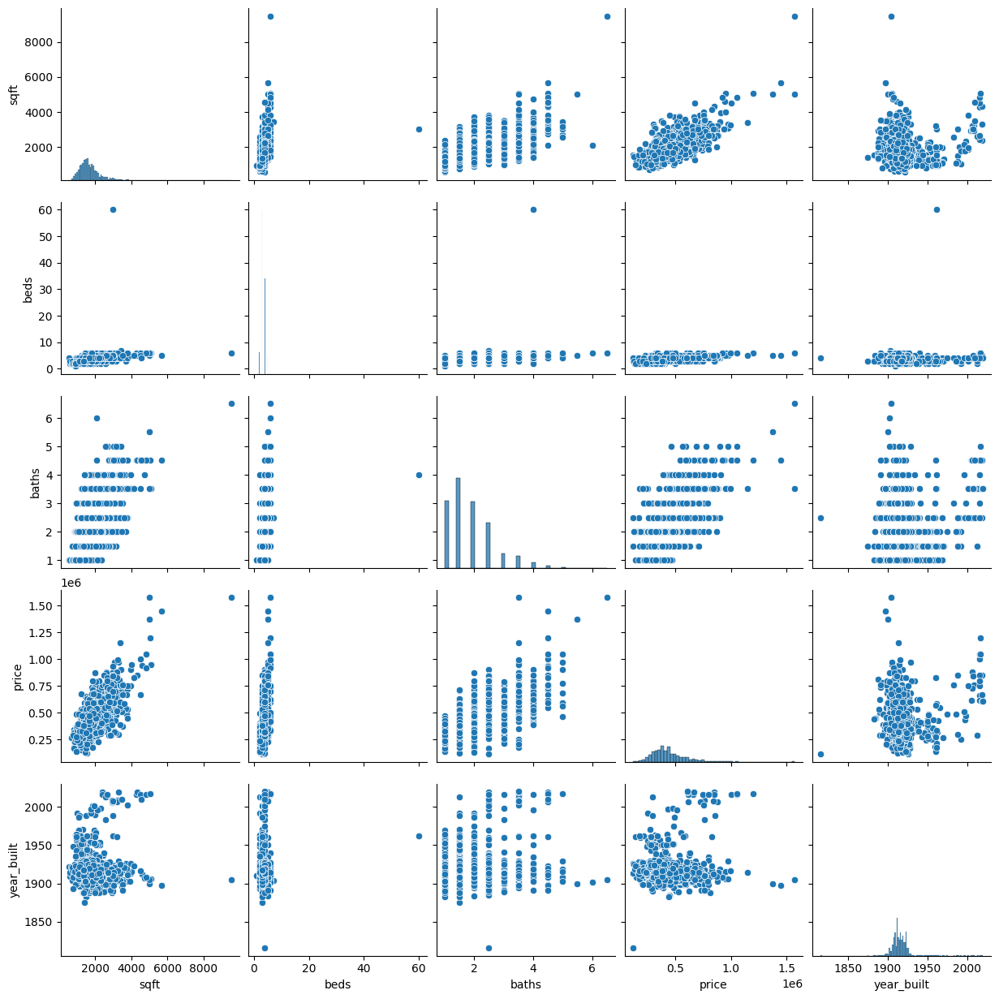

In [277]:
# Pairs plot of square footage, beds, baths, and price
sns.pairplot(rf_metadata, vars=['sqft', 'beds', 'baths', 'price', 'year_built'])


In [278]:
df_merged['home_value'].notna().sum()
# 3141 single-family homes have home values.. cool

3141

In [279]:
# Create dummy variables for logistic regression models
df_merged[['bungalow','foursquare','prairie','victorian']] = pd.get_dummies(df_merged['prediction'])

<Axes: xlabel='latitude', ylabel='foursquare'>

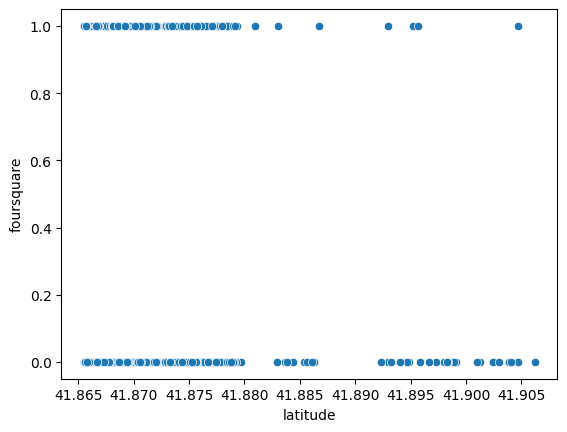

In [280]:
sns.scatterplot(data=df_merged, x='latitude', y='foursquare')
# sns.scatterplot(data=df_merged, x='latitude', y='prairie')
# plt.xscale('log')

### Logistic regression

In [281]:
from sklearn import linear_model

df_drop = df_merged.dropna(subset=['longitude','latitude','foursquare','home_value'])

y = df_drop['foursquare']
X = df_drop[['latitude']]

logr = linear_model.LogisticRegression(verbose=1)

logr.fit(X,y)

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =            2     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.93147D-01    |proj g|=  1.45240D+01

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
    2      6      9      1     0     0   1.884D-05   4.281D-01
  F =  0.42811528702627394     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


 This problem is unconstrained.


LogisticRegression(verbose=1)

In [282]:
odds = np.exp(logr.coef_)
print(odds)


[[0.96000257]]


In [283]:
# logr.coef_
# dir(logr)
logr.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'deprecated',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 1,
 'warm_start': False}

### Linear regression

n= 3141 features
r= -0.16 p= 0.0


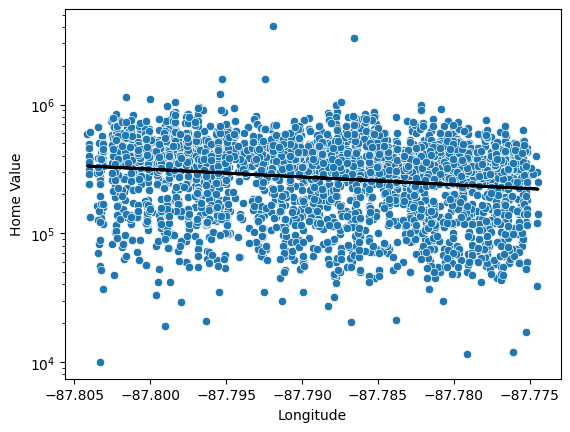

In [284]:
from scipy import stats

sns.scatterplot(data=df_merged, x='longitude', y='home_value')
# sns.scatterplot(data=df_merged, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

df_drop = df_merged.dropna(subset=['longitude','home_value'])

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# r = -0.15, P < 0.001
# there is a negative correlation between longitude and home value
# as we get further from the city (Chicago) center, home values INCREASE

# Residuals plot


# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='black', linewidth=2)
plt.xlabel('Longitude')
plt.ylabel('Home Value')

plt.savefig('reports/figures/home_value_regression.png')

(1890.0, 1940.0)

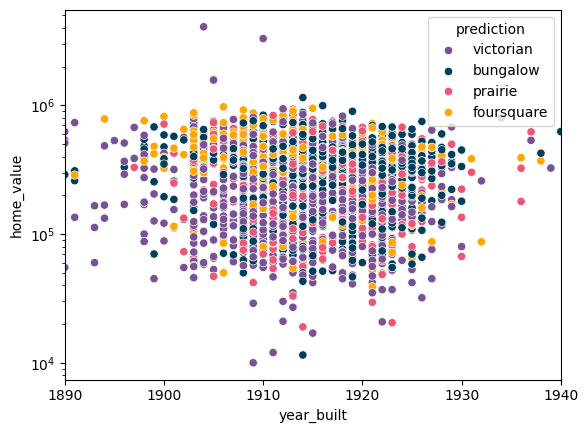

In [285]:
# Plot home value by year built
sns.scatterplot(data=df_merged, x='year_built', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')
plt.xlim(1890, 1940)

In [286]:
# Find home with highest value
df_merged.loc[df_merged['home_value'].idxmax()]
# OK this isn't right. But it is probably a victorian (or maybe foursquare) home


image                                                                737-Wesley-Ave_pid13249690.jpg
prediction                                                                                victorian
probability                                                                                0.878173
pid                                                                                        13249690
input                                                                                737 WESLEY AVE
match                                                                                737 Wesley Ave
property_id                                                                                13249690
latitude                                                                                  41.874797
longitude                                                                                -87.791904
search_url                                          /IL/Oak-Park/737-Wesley-Ave-60304/home/13249690


In [287]:
df_merged['year_built'].min(), df_merged['year_built'].max()
# 2020? let's see about that...

(1816.0, 2020.0)

In [289]:
df_merged[df_merged['year_built'] == 2020]
# might be right.
# looks pretty modern

,image,prediction,probability,pid,input,match,property_id,latitude,longitude,search_url,...,baths,sqft,in_oak_park,unique_homes_in_radius,block,simpson,bungalow,foursquare,prairie,victorian
450,1159-Lyman-Ave_pid13250217.jpg,foursquare,0.901372,13250217,1159 LYMAN AVE,1159 Lyman Ave,13250217,41.866815,-87.776979,/IL/Oak-Park/1159-Lyman-Ave-60304/home/13250217,...,3.5,NaN,1,NaN,783,0.661157,False,True,False,False


In [290]:
# Convert year to an integer
df_merged['year_built'] = df_merged['year_built'].astype(int)

# Get unique years for animating plot
YEARS = sorted(df_merged['year_built'].unique())
YEARS[0:5]

[1816, 1875, 1883, 1884, 1885]

In [217]:
# Make an animated plot

import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.animation import PillowWriter

fig, ax = plt.subplots(1, 1)
fig.set_size_inches(5,3)

ax.axis('off')

map_df.plot(ax=ax, color='gray', linewidth=0.5, alpha=0.5)

def animate(i):
    # ax.clear()
    # Get the point from the points list at index i
    pts = df_merged[df_merged['year_built'] == YEARS[i]]

    # Plot that point using the x and y coordinates
    for pred in prediction_colors.keys():
        subset = pts[pts['prediction'] == pred]
        ax.plot(subset['longitude'], subset['latitude'], color=prediction_colors[pred], label=pred, marker='o', linestyle='None', markersize=2)

    ax.set_title(f'Year: {YEARS[i]}')

    # Set the x and y axis to display a fixed range
    ax.set_xlim(df_merged['longitude'].min(), df_merged['longitude'].max())
    ax.set_ylim(df_merged['latitude'].min(), 41.88)

ani = FuncAnimation(fig, animate, frames=len(YEARS), interval=100, repeat=False)
plt.close()

# Save the animation as an animated GIF
ani.save("simple_animation.gif", dpi=300, writer=PillowWriter(fps=1))

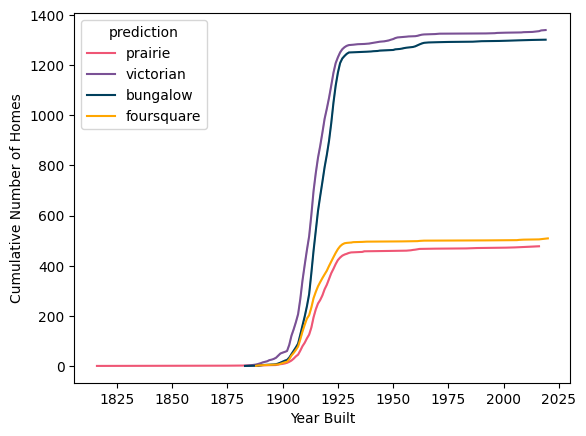

In [291]:
# Sort dataframe by year built
df_merged.sort_values(by='year_built', ascending=True, inplace=True)

# Count the cumulative number of homes grouped by prediction (home style)
df_merged['cumsum_year'] = df_merged.groupby('prediction')['year_built'].cumcount()

sns.lineplot(data=df_merged, x='year_built', y='cumsum_year', hue='prediction', palette=prediction_colors)
plt.xlabel('Year Built')
plt.ylabel('Cumulative Number of Homes')
plt.savefig('reports/figures/cumsum_year.png')

## Multiple regression for home values

In [292]:
df_merged['homes_nnd'] = find_unique(df_merged, radius=0.001, stratify=False)

r= -0.03 p= 0.096


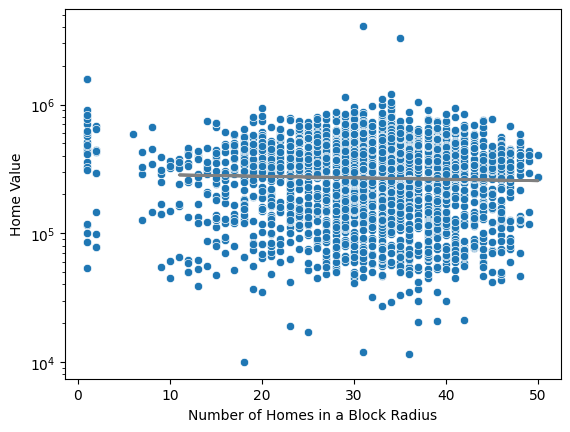

In [293]:
from scipy import stats

# sns.histplot(data=df_merged, x='homes_nnd', bins=20)
sns.scatterplot(data=df_merged, x='homes_nnd', y='home_value') # 0.001 is about 100 meters
plt.yscale('log')
plt.ylabel('Home Value')
plt.xlabel('Number of Homes in a Block Radius')

df_drop = df_merged.dropna(subset=['homes_nnd','home_value'])
df_drop = df_drop[df_drop['homes_nnd'] > 10]

x = df_drop['homes_nnd']
y = np.log(df_drop['home_value'])
slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r, 2), 'p=', round(p, 3))

# Plot the regression line
plt.plot(x, np.exp(slope * x + intercept), color='gray', linewidth=2)

# No relationship between home density and home value

In [294]:
df_merged.columns

Index(['image', 'prediction', 'probability', 'pid', 'input', 'match',
       'property_id', 'latitude', 'longitude', 'search_url', 'image_url',
       'home_value', 'home_type', 'year_built', 'lot_size', 'price', 'beds',
       'baths', 'sqft', 'in_oak_park', 'unique_homes_in_radius', 'block',
       'simpson', 'bungalow', 'foursquare', 'prairie', 'victorian',
       'cumsum_year', 'homes_nnd'],
      dtype='object')

In [379]:
# Look at interaction longitude and architectural style
# Does home value always increase as we move further from the city center?

import statsmodels.api as sm
import statsmodels.formula.api as smf

MYVARS = ['latitude', 'longitude', 'prediction', 'home_density', 'year_built', 'simpson', 'beds', 'baths', 'sqft', 'lot_size', 'price']

# Remove rows with missing values
df_drop = df_merged.dropna(subset=MYVARS)

# Split data into training and testing sets
X = df_drop[['latitude', 'longitude', 'prediction', 'home_density', 'year_built', 'simpson', 'beds', 'baths', 'sqft', 'lot_size']]
y = df_drop['price']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=44)

df_train = pd.concat([X_train, y_train], axis=1)
df_test = pd.concat([X_test, y_test], axis=1)

# Fit a generalized linear model
model_train = smf.glm('price ~ latitude + longitude + prediction + home_density + year_built + simpson + beds + baths + sqft + lot_size',
                      data=df_train, family=sm.families.Gaussian())

fit_train = model_train.fit()

fit_train.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:                  price   No. Observations:                  971
Model:                            GLM   Df Residuals:                      958
Model Family:                Gaussian   Df Model:                           12
Link Function:               Identity   Scale:                      9.9799e+09
Method:                          IRLS   Log-Likelihood:                -12549.
Date:                Thu, 17 Oct 2024   Deviance:                   9.5607e+12
Time:                        19:09:06   Pearson chi2:                 9.56e+12
No. Iterations:                     3   Pseudo R-squ. (CS):             0.8465
Covariance Type:            nonrobust                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
Intercept                -4.485e+08   4.99e+07     -8.989      0.000   -5.46e+08   -3.51e+08
prediction[T.foursquare]  1.478e+04   8469.513      1.745      0.081   -1821.906    3.14e+04
prediction[T.prairie]     1.472e+04   1.15e+04      1.278      0.201   -7845.936    3.73e+04
prediction[T.victorian]   7751.1304   9241.827      0.839      0.402   -1.04e+04    2.59e+04
latitude                  4.504e+06   7.54e+05      5.975      0.000    3.03e+06    5.98e+06
longitude                -2.952e+06   4.16e+05     -7.097      0.000   -3.77e+06   -2.14e+06
home_density              1076.2436    413.711      2.601      0.009     265.385    1887.102
year_built                 382.1670    212.613      1.797      0.072     -34.548     798.882
simpson                  -1.387e+04    2.7e+04     -0.514      0.607   -6.68e+04    3.91e+04
beds                      1.059e+04   5351.857      1.978      0.048      98.849    2.11e+04
baths                     5.916e+04   5199.772     11.378      0.000     4.9e+04    6.94e+04
sqft                       107.0805      6.761     15.837      0.000      93.829     120.332
lot_size                     1.8636      2.799      0.666      0.505      -3.622       7.349
============================================================================================
"""

In [382]:
# predict from model
y_pred = fit_train.predict(X_test)

# X_test, X_train
    
# Calculate RMSE
from sklearn.metrics import mean_squared_error

rmse = np.sqrt(mean_squared_error(y_test, y_pred))
print(f"RMSE: {rmse}")

AVG_PRICE = df_merged['price'].mean()

print('RMSE = $', round(rmse, 2))
print('Average price = $', round(AVG_PRICE, 2))
print('RMSE/Average price = ', 100*round(rmse/AVG_PRICE, 2), '%')



RMSE: 90551.91501329768
RMSE = $ 90551.92
Average price = $ 437327.81
RMSE/Average price =  21.0 %


In [ ]:


# Add unique homes in radius column
df_merged['home_density'] = find_unique(df_merged, radius=0.001, stratify=False)  # .001 is about 100 meters (1 block)
df_merged['unique_home_styles'] = find_unique(df_merged, radius=0.0002, stratify=True)  # .0002 is about 20 meters

# sns.scatterplot(data=df_merged, x='unique_homes_in_radius', y='home_value')

df_drop = df_merged.dropna(subset=['longitude','latitude','home_value'])

# Fit a generalized linear model
# model = smf.glm('np.log(home_value) ~ (latitude + longitude) + prediction', data=df_drop, family=sm.families.Gaussian())
model1 = smf.glm('price ~ latitude + longitude + prediction + home_density + year_built + simpson + beds + baths + sqft + lot_size', data=df_drop, family=sm.families.Gaussian())
model2 = smf.glm('price ~ latitude + longitude + prediction + home_density + year_built + beds + baths + sqft + lot_size', data=df_drop, family=sm.families.Gaussian())
model3 = smf.glm('price ~ latitude + longitude + home_density + year_built + beds + baths + sqft + lot_size', data=df_drop, family=sm.families.Gaussian())
fit1 = model1.fit()
fit2 = model2.fit()
fit3 = model3.fit()

# We can see that none of the interactions are significant, so just latitude and longitude are important
# fit1.summary(), 
print(fit1.summary())
print(fit2.summary())
print(fit3.summary())



In [298]:
# Compare likelihood ratios

# Calculate the likelihood ratio for each model
likelihood_ratio = 2 * (fit2.llf - fit3.llf)

# Print the results
print(f"Likelihood ratio for model 2 vs model 3: {likelihood_ratio}")

# Model with home type is 7X better than model without home type


Likelihood ratio for model 2 vs model 3: 7.061304097143875


### Plot regression results

In [ ]:
# Summarize multiple regression results

# calculate RMSE from regression model


RMSE = root_mean_squared_error(y_test, y_pred)

AVG_PRICE = df_merged['price'].mean()

print('RMSE = $', round(RMSE, 2))
print('Average price = $', round(AVG_PRICE, 2))
print('RMSE/Average price = ', 100*round(RMSE/AVG_PRICE, 2), '%')



## Trying out random forest regression

In [336]:
# Random forest regression

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

XVARS = ['latitude','longitude','year_built','prediction','beds', 'baths', 'sqft', 'lot_size']
YVAR = 'price'

# Drop rows with missing values
df_drop = df_merged.dropna(subset=XVARS+[YVAR])

# Split the data into training and testing sets
X = df_drop[XVARS]
X = pd.get_dummies(X, columns = ['prediction'])
y = df_drop[YVAR]

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=44)

# # Fit the random forest model
regr = RandomForestRegressor(max_depth=10, random_state=0)
regr.fit(X_train, y_train)

# Get the R^2 score (57% prediction accuracy)
print(regr.score(X_test, y_test))

# Calculate RMSE
from sklearn.metrics import root_mean_squared_error

y_pred = regr.predict(X_test)

RMSE = root_mean_squared_error(y_test, y_pred)

AVG_PRICE = df_merged['price'].mean()

print('RMSE = $', round(RMSE, 2))
print('Average price = $', round(AVG_PRICE, 2))
print('RMSE/Average price = ', 100*round(RMSE/AVG_PRICE, 2), '%')


0.5732709554663074
RMSE = $ 92544.04
Average price = $ 437327.81
RMSE/Average price =  21.0 %


In [695]:
# Fitting a RF without the simpson index

# Split the data into training and testing sets
X = df_drop[['latitude','longitude','year_built','prediction']]
X = pd.get_dummies(X, columns = ['prediction'])
y = df_drop['home_value']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=44)

# Fit the random forest model
regr = RandomForestRegressor(max_depth=10, random_state=0)
regr.fit(X_train, y_train)

# Get the R^2 score
print(regr.score(X_test, y_test))


0.19028386868638913


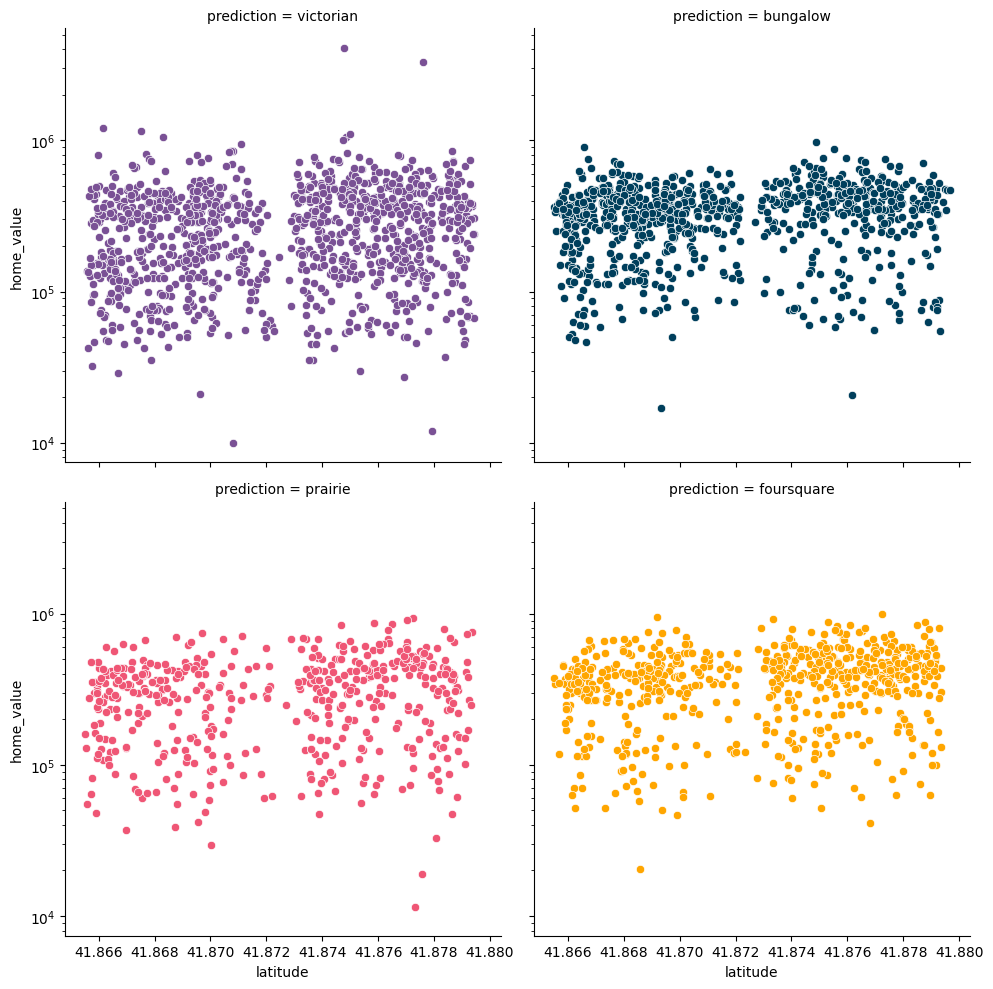

In [110]:
# Plotting the regression results
df_filter = df_drop[df_drop['latitude'] < 41.88]
g = sns.FacetGrid(df_filter, col='prediction', col_wrap=2, height=5, hue='prediction', palette=prediction_colors)
g.map(sns.scatterplot, 'latitude', 'home_value')
plt.yscale('log')

n= 897 features
r= -0.25 p= 0.0


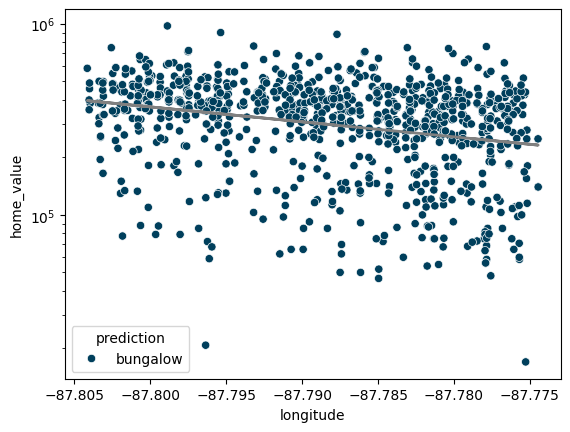

In [337]:
# Bungalows

from scipy import stats

df_drop = df_merged.dropna(subset=['longitude','home_value'])
df_drop = df_drop[df_drop['prediction'] == 'bungalow']

sns.scatterplot(data=df_drop, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='gray', linewidth=2)


n= 799 features
r= -0.13 p= 0.0


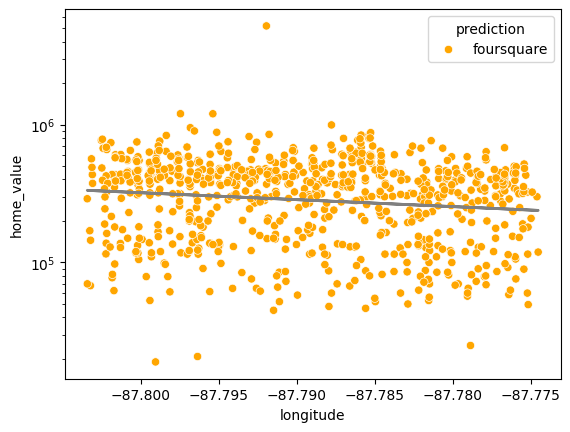

In [49]:
# American foursquares

df_drop = df_merged.dropna(subset=['longitude','home_value'])
df_drop = df_drop[df_drop['prediction'] == 'foursquare']

sns.scatterplot(data=df_drop, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='gray', linewidth=2)


n= 476 features
r= -0.08 p= 0.079


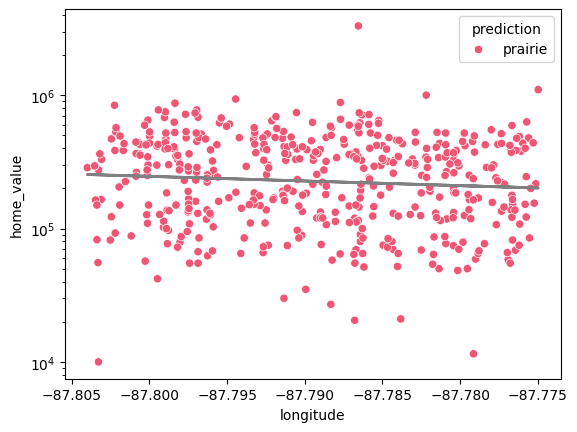

In [56]:
# Prairie style homes

df_drop = df_merged.dropna(subset=['longitude','home_value'])
df_drop = df_drop[df_drop['prediction'] == 'prairie']

sns.scatterplot(data=df_drop, x='longitude', y='home_value', hue='prediction', palette=prediction_colors)
plt.yscale('log')

# Fit a linear regression
x = df_drop['longitude']
y = np.log(df_drop['home_value'])

print('n=', len(y), 'features')

slope, intercept, r, p, std_err = stats.linregress(x, y)

print('r=', round(r,2), 'p=', round(p,3))

# Plot the regression line
plt.plot(x, np.exp(slope*x + intercept), color='gray', linewidth=2)
